<a href="https://colab.research.google.com/github/alicedhuynh/Rcode-for-STAT-560/blob/master/CaptionBookProject(updated).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this project, we will use unsupervised learning on a synthetic dataset from a fictional brick-and-mortar store called Captain Book, was created for educational purposes. This dataset can be accessed at [openclassrooms](https://openclassrooms.com/en/projects/560/assignment). There are 3 files which are
- Sales
- list of customers
- list of products

We will merge the data together and create new features






## Mount Google Drive and Import Libararies

In [ ]:
# Import libraries
'''Main'''
import pandas as pd, numpy as np
'''Data Visualization'''
import matplotlib.pyplot as plt, seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
'''Data Preprocessing and Model Evaluation'''
import datetime as dt
from scipy.stats import shapiro
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn import datasets, metrics
from sklearn.pipeline import make_pipeline
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# load the datasets
customers_df = pd.read_csv("/content/drive/MyDrive/Data Science /CheggSkills-Data_Science_Bootcamp/4. Unsupervised learning/customers.csv")
products_df = pd.read_csv("/content/drive/MyDrive/Data Science /CheggSkills-Data_Science_Bootcamp/4. Unsupervised learning/products.csv")
transactions_df = pd.read_csv("/content/drive/MyDrive/Data Science /CheggSkills-Data_Science_Bootcamp/4. Unsupervised learning/transactions.csv")

In [ ]:
# View all dataframe
dataframes = [customers_df, products_df, transactions_df]
dfs_name = ['=== customers_df ===', '=== products_df ===', '=== transactions_df ===']
for name, dataframe in zip(dfs_name, dataframes):
  print(name)
  print(dataframe.head(2))
  print(dataframe.tail(2))
  print("")


=== customers_df ===
  client_id sex  birth
0    c_4410   f   1967
1    c_7839   f   1975
     client_id sex  birth
8621    c_5643   f   1968
8622      c_84   f   1982

=== products_df ===
  id_prod  price  categ
0  0_1421  19.99      0
1  0_1368   5.13      0
     id_prod  price  categ
3285   1_140  38.56      1
3286  0_1920  25.16      0

=== transactions_df ===
  id_prod                        date session_id client_id
0  0_1483  2021-04-10 18:37:28.723910    s_18746    c_4450
1   2_226  2022-02-03 01:55:53.276402   s_159142     c_277
       id_prod                        date session_id client_id
337014   2_227  2021-10-30 16:50:15.997750   s_112349       c_5
337015  0_1417  2021-06-26 14:38:19.732946    s_54117    c_6714



In [ ]:
# Create `age` column
customers_df['age'] = 2022 - customers_df['birth']

In [ ]:
# merge dataframe together
df1_merge = pd.merge(customers_df, transactions_df, on='client_id', how = 'outer')
df1_merge = pd.merge(df1_merge, products_df, on='id_prod', how = 'outer')
df1_merge.head()
df = df1_merge.copy()

In [ ]:
# display statistics for numerical and categorial variables
display(df.describe().T)
display(df.describe(include='object').T)

,count,mean,std,min,25%,50%,75%,max
birth,337037.0,1977.837558,13.532230,1929.0,1971.00,1980.0,1987.00,2004.0
age,337037.0,44.162442,13.532230,18.0,35.00,42.0,51.00,93.0
price,336935.0,17.205621,17.861165,-1.0,8.58,13.9,18.99,300.0
categ,336935.0,0.429896,0.591008,0.0,0.00,0.0,1.00,2.0


,count,unique,top,freq
client_id,337037,8623,c_1609,12855
sex,337037,2,m,169345
id_prod,337038,3288,1_369,1081
date,337016,336855,test_2021-03-01 02:30:02.237413,13
session_id,337016,169195,s_0,200


In [ ]:
# Check for inconsistently in data
for col in df.columns.tolist():
  print(f"=== {col} ===")
  print(list(df[col].unique()))
  print(df[col].dtype)
  print("")

=== client_id ===
['c_4410', 'c_4389', 'c_5019', 'c_7049', 'c_5110', 'c_6699', 'c_1953', 'c_1381', 'c_6950', 'c_4325', 'c_2755', 'c_1905', 'c_7958', 'c_5974', 'c_7991', 'c_605', 'c_8124', 'c_2103', 'c_4309', 'c_4586', 'c_7388', 'c_2305', 'c_2118', 'c_4844', 'c_8486', 'c_6535', 'c_825', 'c_3700', 'c_6151', 'c_3072', 'c_6880', 'c_7526', 'c_8603', 'c_8282', 'c_7711', 'c_8191', 'c_5921', 'c_5207', 'c_3791', 'c_5056', 'c_677', 'c_5511', 'c_7664', 'c_6960', 'c_7324', 'c_2982', 'c_2100', 'c_7290', 'c_761', 'c_1177', 'c_6384', 'c_2331', 'c_8607', 'c_53', 'c_3270', 'c_7945', 'c_2751', 'c_5911', 'c_780', 'c_2137', 'c_1250', 'c_5795', 'c_5815', 'c_4769', 'c_3804', 'c_6168', 'c_5801', 'c_99', 'c_5452', 'c_2370', 'c_6991', 'c_8172', 'c_2561', 'c_3377', 'c_8213', 'c_7262', 'c_77', 'c_1802', 'c_8120', 'c_2588', 'c_2841', 'c_8136', 'c_7813', 'c_3006', 'c_2538', 'c_2084', 'c_8433', 'c_8055', 'c_2087', 'c_6885', 'c_7143', 'c_6813', 'c_4834', 'c_7799', 'c_4743', 'c_6646', 'c_4879', 'c_4587', 'c_8252', 'c

everything looks good except date has to time a date format, and there are some nan.

In [ ]:
# find missing data
for col in df.columns:
    # Get the rows where the column has missing values
    print(f"=== {col} null value dataframe===")
    num_missing_values = df[col].isnull().sum()
    data_dimensions = df.shape[0]
    percentage_missing_values = round(num_missing_values / data_dimensions* 100, 2)
    print(f"Number of missing values: {num_missing_values}")
    print(f"Percentage of missing values: {percentage_missing_values}")
    print("")

=== client_id null value dataframe===
Number of missing values: 22
Percentage of missing values: 0.01

=== sex null value dataframe===
Number of missing values: 22
Percentage of missing values: 0.01

=== birth null value dataframe===
Number of missing values: 22
Percentage of missing values: 0.01

=== age null value dataframe===
Number of missing values: 22
Percentage of missing values: 0.01

=== id_prod null value dataframe===
Number of missing values: 21
Percentage of missing values: 0.01

=== date null value dataframe===
Number of missing values: 43
Percentage of missing values: 0.01

=== session_id null value dataframe===
Number of missing values: 43
Percentage of missing values: 0.01

=== price null value dataframe===
Number of missing values: 124
Percentage of missing values: 0.04

=== categ null value dataframe===
Number of missing values: 124
Percentage of missing values: 0.04



There missing values in `price`, `catg`, `id_prod`, `date`, and `session_id`

There are 22 inactive `id_prod`, 21 inactive client. We need to remove missing value in `client_id` and `id_prod`

In [ ]:
df.dropna(subset = ['client_id', 'id_prod'], inplace=True)

In [ ]:
# check for any null
df.isnull().sum()

,0
client_id,0
sex,0
birth,0
age,0
id_prod,0
date,0
session_id,0
price,103
categ,103


In [ ]:
# look a the data with missing values
df[df['price'].isnull()]

,client_id,sex,birth,age,id_prod,date,session_id,price,categ
266960,c_4505,m,1976.0,46.0,0_2245,2022-01-09 09:23:31.000720,s_147220,NaN,NaN
266961,c_3468,f,1981.0,41.0,0_2245,2021-09-11 10:52:05.205583,s_88251,NaN,NaN
266962,c_1403,f,1978.0,44.0,0_2245,2022-02-15 14:26:50.187952,s_165575,NaN,NaN
266963,c_3065,f,1977.0,45.0,0_2245,2022-01-26 13:34:33.440366,s_155484,NaN,NaN
266964,c_7102,m,1983.0,39.0,0_2245,2021-04-25 19:58:42.716401,s_25704,NaN,NaN
...,...,...,...,...,...,...,...,...,...
267058,c_8138,f,1984.0,38.0,0_2245,2021-10-04 21:20:27.540982,s_100047,NaN,NaN
267059,c_7416,m,1933.0,89.0,0_2245,2021-11-12 09:25:22.905886,s_118458,NaN,NaN
267060,c_4283,f,1976.0,46.0,0_2245,2021-09-01 02:46:38.931757,s_83377,NaN,NaN
267061,c_6236,f,1976.0,46.0,0_2245,2022-02-25 00:08:08.736068,s_170426,NaN,NaN


Only `prod_id` = `0_2245` has missing values in both `price` and `catg`

In [ ]:
# Check to see if there's price for product '0_2245'
products_df.loc[(products_df['id_prod']== '0_2245')]

,id_prod,price,categ


We can see that `id_prod` = `0_2245` has a 103 missing `price` and `catg`. When we check if there's a 0_2245 in the products dataframe there isn't. This could mean someone forgot to add this product into the system. We replace the missing value in `categ` column as 0 and look at the disbribution for price and see if we should find the median or mean replace the missing value with that.

Text(0.5, 0, 'frequency')

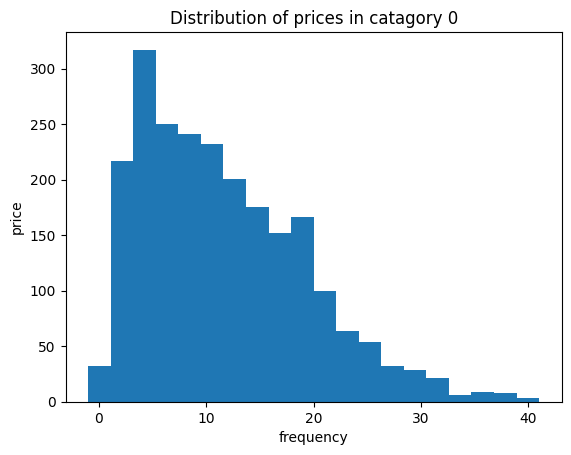

In [ ]:
price_df_categ_0 = products_df
price_df_categ_0 = price_df_categ_0[price_df_categ_0['categ'] == 0]
plt.hist(price_df_categ_0['price'], bins = 20)
plt.title('Distribution of prices in catagory 0')
plt.ylabel('price')
plt.xlabel('frequency')

It doesn't look like a normal distrubtion. We can test this with the shapiro test. If it turns out be not normal. So we will calculate the median.

In [ ]:
shapiro(price_df_categ_0['price'])

ShapiroResult(statistic=0.9412686429248626, pvalue=2.4230120173856295e-29)

We have sufficent evidence to say this data is normally distrubuted. I will replace the missing value with the median instead of the mean.

In [ ]:
median_price = price_df_categ_0['price'].median()
df.loc[(df['id_prod']== '0_2245'), 'price'] = median_price
df.loc[(df['id_prod']== '0_2245'), 'categ'] = int(0)

In [ ]:
df.loc[(df['id_prod']== '0_2245')]

,client_id,sex,birth,age,id_prod,date,session_id,price,categ
266960,c_4505,m,1976.0,46.0,0_2245,2022-01-09 09:23:31.000720,s_147220,10.32,0.0
266961,c_3468,f,1981.0,41.0,0_2245,2021-09-11 10:52:05.205583,s_88251,10.32,0.0
266962,c_1403,f,1978.0,44.0,0_2245,2022-02-15 14:26:50.187952,s_165575,10.32,0.0
266963,c_3065,f,1977.0,45.0,0_2245,2022-01-26 13:34:33.440366,s_155484,10.32,0.0
266964,c_7102,m,1983.0,39.0,0_2245,2021-04-25 19:58:42.716401,s_25704,10.32,0.0
...,...,...,...,...,...,...,...,...,...
267058,c_8138,f,1984.0,38.0,0_2245,2021-10-04 21:20:27.540982,s_100047,10.32,0.0
267059,c_7416,m,1933.0,89.0,0_2245,2021-11-12 09:25:22.905886,s_118458,10.32,0.0
267060,c_4283,f,1976.0,46.0,0_2245,2021-09-01 02:46:38.931757,s_83377,10.32,0.0
267061,c_6236,f,1976.0,46.0,0_2245,2022-02-25 00:08:08.736068,s_170426,10.32,0.0


In [ ]:
# Convert `date` column to datetime format
df['date'] = pd.to_datetime(df['date'], errors='coerce')

# Check for inconsistent date formatting and remove it
df[df['date'].isnull()]


,client_id,sex,birth,age,id_prod,date,session_id,price,categ
336234,ct_0,f,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
336235,ct_0,f,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
336236,ct_0,f,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
336237,ct_0,f,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
336238,ct_0,f,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
...,...,...,...,...,...,...,...,...,...
336429,ct_1,m,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
336430,ct_1,m,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
336431,ct_1,m,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0
336432,ct_1,m,2001.0,21.0,T_0,NaT,s_0,-1.0,0.0


In [ ]:
df.dropna(subset=['date'], inplace=True)

In [ ]:
# check to see if there's any null
df[df['date'].isnull()]

,client_id,sex,birth,age,id_prod,date,session_id,price,categ


In [ ]:
# check for duplicate
df.duplicated().sum()

0

In [ ]:
print(df.info(), df.describe())

<class 'pandas.core.frame.DataFrame'>
Index: 336816 entries, 0 to 337036
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   client_id   336816 non-null  object        
 1   sex         336816 non-null  object        
 2   birth       336816 non-null  float64       
 3   age         336816 non-null  float64       
 4   id_prod     336816 non-null  object        
 5   date        336816 non-null  datetime64[ns]
 6   session_id  336816 non-null  object        
 7   price       336816 non-null  float64       
 8   categ       336816 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(4)
memory usage: 25.7+ MB
None                birth            age                           date  \
count  336816.000000  336816.000000                         336816   
mean     1977.823396      44.176604  2021-09-03 02:15:11.058547968   
min      1929.000000      18.000000     2021-03-01 00:01:07.843138   

In [ ]:
pd.DataFrame([{'products': len(df['id_prod'].value_counts()),
               'transactions': len(df['session_id'].value_counts()),
               'customers': len(df['client_id'].value_counts()),
              }], columns = ['products', 'transactions', 'customers'], index = ['quantity'])

,products,transactions,customers
quantity,3265,169194,8600


## Creating RFM Features for Segmentation

RFM is a method used for analyzing customer behavior based these threee factor:

1. **Recency:** How recently a customer has made a purchase?
2. **Frequency:** How often a customer make a purchase?
3. **Monetary value:** How much money a customer spend on average and in total?




In [ ]:
print('Min: {}, Max: {}'.format(min(df.date), max(df.date)))
snapshot_date = max(df.date) + dt.timedelta(days=1)

# Aggregate data on customer level
recency_frequency = df.groupby(['client_id']).agg({
    'date': lambda x: (snapshot_date - x.max()).days,
    'session_id': 'nunique',
    'id_prod': ['count', 'nunique']})

# Rename columns for easier interpretation
recency_frequency.columns = ['days_since_last_purchase', 'transcation_count', 'product_count', 'unique_product_count']
recency_frequency = recency_frequency.reset_index()

monetary = df.groupby(['client_id','session_id'])['price'].sum().reset_index()
monetary = monetary.groupby('client_id').agg({'price': ['sum', 'mean']})

monetary = df.groupby(['client_id','session_id'])['price'].sum().reset_index()
monetary = monetary.groupby('client_id').agg({'price': ['sum', 'mean']})

monetary.columns = ['total_spend', 'avg_spend']
monetary = monetary.reset_index()


Min: 2021-03-01 00:01:07.843138, Max: 2022-02-28 23:59:58.040472


In [ ]:
customer_rfm = pd.merge(recency_frequency, monetary, on='client_id', how='outer')
customer_rfm.head()

,client_id,days_since_last_purchase,transcation_count,product_count,unique_product_count,total_spend,avg_spend
0,c_1,28,15,20,19,300.65,20.043333
1,c_10,77,16,28,27,586.18,36.636250
2,c_100,203,3,6,6,222.87,74.290000
3,c_1000,1,42,56,52,980.02,23.333810
4,c_1001,3,24,58,56,1102.45,45.935417


In [ ]:
def plot_dist_boxplot(df, columns, whisker):
  row_num = int(np.ceil(df[columns].shape[1]/2*2)) # Calculate the number of rows needed to accommodate all plots
  fig, ax = plt.subplots(nrows=row_num, ncols=2, figsize=(10, 30))
  ax = ax.flatten()
  for index, column in enumerate(df[columns]):
    skewness = df[column].skew()
    kurtosis = df[column].kurt()
    ax[2 * index].hist(df[column], bins = 30)
    ax[2 * index].set_title(f"Distribution of {column}")
    ax[2 * index].set_xlabel(column)
    ax[2 * index].grid(True)
    ax[2 * index].text(0.5, -0.4, f"Skewness: {skewness:.2f}\nKurtosis: {kurtosis:.2f}",
                       ha='center', va='top', transform=ax[2 * index].transAxes)

    ax[2 * index + 1].boxplot(df[column], whis=whisker)
    ax[2 * index + 1].set_title(f"Boxplot of {column}")
    ax[2 * index + 1].set_xlabel(column)
    ax[2 * index + 1].grid(True)

  plt.tight_layout()
  plt.show()


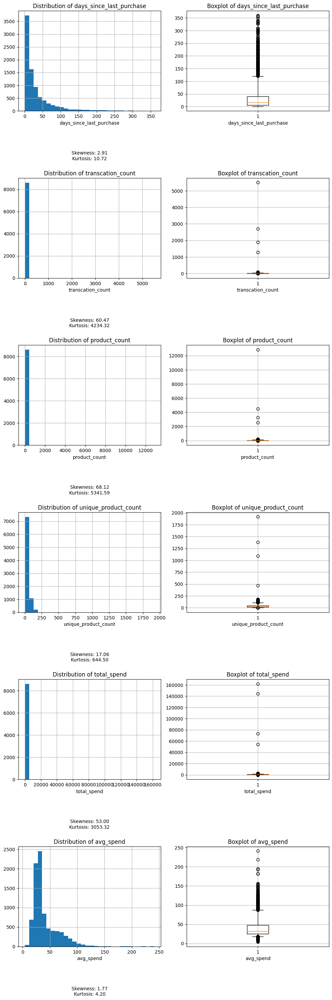

In [ ]:
selected_columns = ['days_since_last_purchase', 'transcation_count', 'product_count', 'unique_product_count', 'total_spend', 'avg_spend']
plot_dist_boxplot(customer_rfm, selected_columns, [5,95])

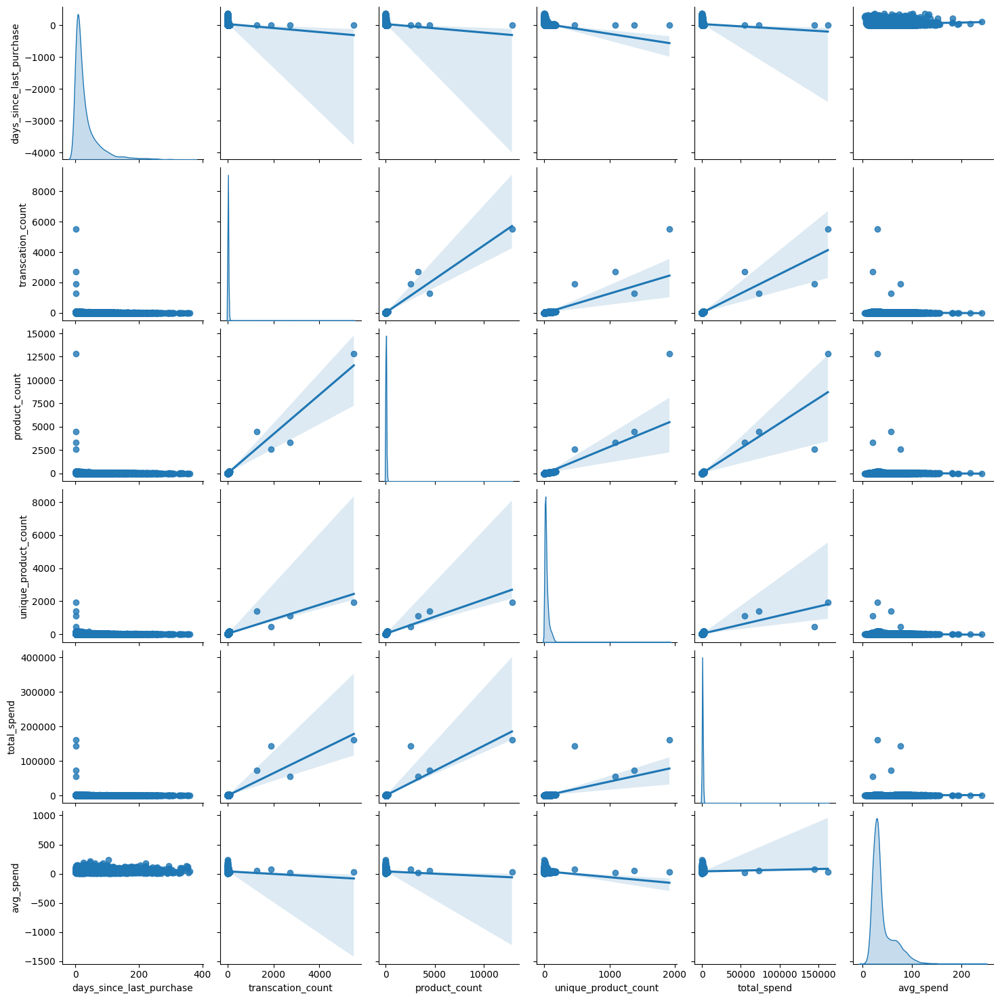

In [ ]:
# Create the pair plot
sns.pairplot(customer_rfm, kind = 'reg', diag_kind = 'kde')

In [ ]:
log_tranformed = np.log(customer_rfm[selected_columns])

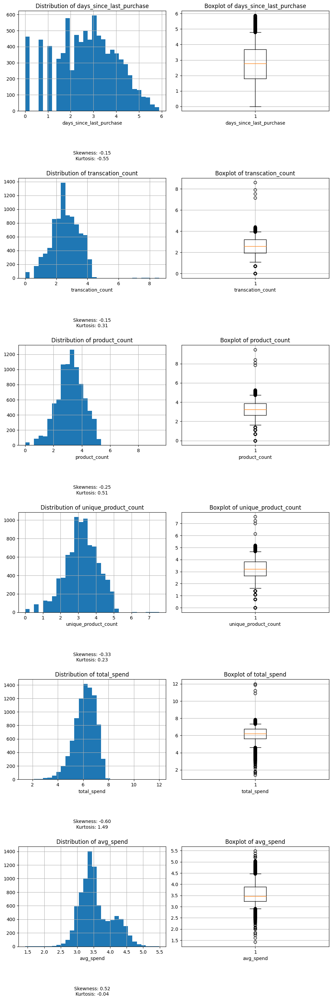

In [ ]:
plot_dist_boxplot(log_tranformed, selected_columns, [5,95])

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(log_tranformed)
scaled_data = pd.DataFrame(scaled_data, columns=selected_columns)

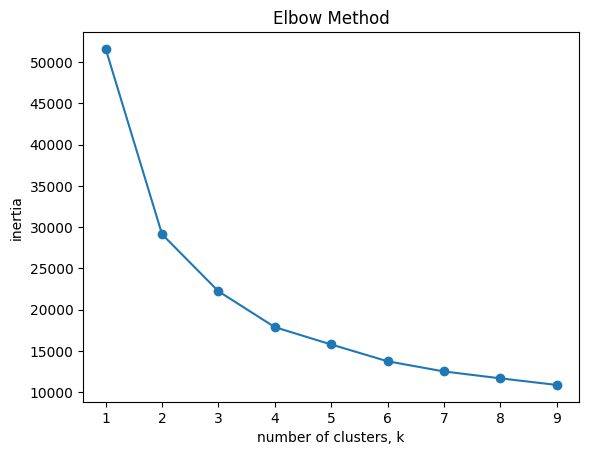

In [ ]:
ks = range(1, 10)
inertias = []
for k in ks:
# Create a KMeans instance with k clusters: model
  model = KMeans(n_clusters=k)
# Fit model to scaled_data
  model.fit(scaled_data)
# append the inertia to the list of inertias
  inertias.append(model.inertia_)

# Plot ks vs. inertias
plt.plot(ks, inertias, '-o')
plt.title('Elbow Method')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()


In [ ]:
# K-Means Clustering
kmeans = KMeans(n_clusters=4, random_state=123)
kmeans_labels=kmeans.fit_predict(scaled_data)
scaled_data['cluster'] = kmeans_labels

pca = PCA(n_components=3)
pca_result = pca.fit_transform(scaled_data)


# Create a DataFrame for the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2', 'PC3'])
pca_df['kmeans_labels'] = kmeans_labels

# Create an interactive 3D scatter plot
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', title='3D PCA Plot', color='kmeans_labels',
                     labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'})

# Show the plot
fig.show()

# Calculate silhouette score for K-means
kmeans_silhouette = silhouette_score(scaled_data, kmeans_labels)
print(f'K-means Silhouette Score: {kmeans_silhouette:.4f}')

K-means Silhouette Score: 0.4520


In [ ]:
# Hierarchical clustering
hierarchical = AgglomerativeClustering(n_clusters=4)
hierarchical_labels = hierarchical.fit_predict(scaled_data)

# Create a DataFrame for the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2', 'PC3'])
pca_df['hierarchical_labels'] = hierarchical_labels

# Create an interactive 3D scatter plot
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', title='3D PCA Plot', color='hierarchical_labels',
                     labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'})

# Show the plot
fig.show()

# Calculate silhouette score for hierarchical clustering
hierarchical_silhouette = silhouette_score(scaled_data, hierarchical_labels)
print(f'Hierarchical Silhouette Score: {hierarchical_silhouette:.4f}')


Hierarchical Silhouette Score: 0.4512


After comparing the the k-means and hierarchical silhouette score, k-means is the winner with a slightly betters score.

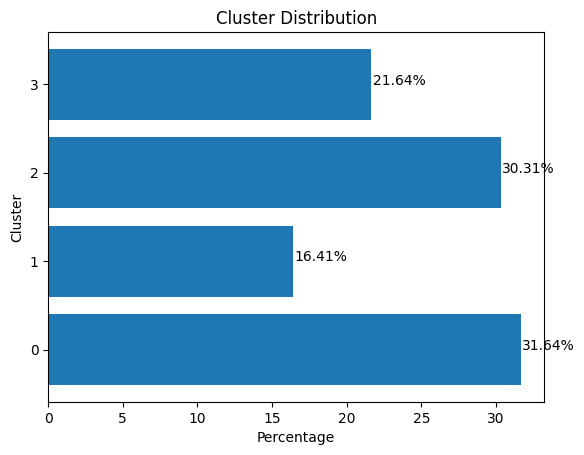

In [ ]:
customer_rfm['cluster'] = kmeans_labels
cluster_distribution = customer_rfm.groupby('cluster').agg({'cluster': [lambda x: round(len(x)/len(customer_rfm)*100,2), 'count']})
cluster_distribution.columns = ['percentage', 'count']
cluster_distribution = cluster_distribution.reset_index()

cluster_distribution['cluster'] = cluster_distribution['cluster'].astype(str)
# Horizontal Bar Graph
plt.barh(cluster_distribution['cluster'], cluster_distribution['percentage'])
plt.title('Cluster Distribution')
plt.xlabel('Percentage')
plt.ylabel('Cluster')
# Adding percentages on the bars
for index, value in enumerate(cluster_distribution['percentage']):
    plt.text(value +.1, index, f'{value:.2f}%', ha='left')
plt.show()








In [ ]:
customer_rfm

,client_id,days_since_last_purchase,transcation_count,product_count,unique_product_count,total_spend,avg_spend,cluster
0,c_1,28,15,20,19,300.65,20.043333,0
1,c_10,77,16,28,27,586.18,36.636250,0
2,c_100,203,3,6,6,222.87,74.290000,1
3,c_1000,1,42,56,52,980.02,23.333810,2
4,c_1001,3,24,58,56,1102.45,45.935417,2
...,...,...,...,...,...,...,...,...
8595,c_995,117,5,8,8,119.08,23.816000,1
8596,c_996,23,36,42,41,739.60,20.544444,2
8597,c_997,55,10,23,23,572.89,57.289000,3
8598,c_998,6,13,28,28,1527.69,117.514615,3


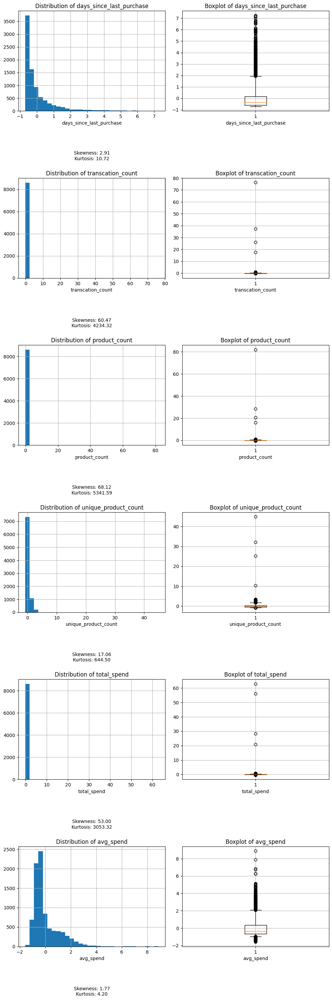

In [ ]:
df_standardized = scaler.fit_transform(customer_rfm[selected_columns])
df_standardized = pd.DataFrame(df_standardized, columns=selected_columns)
df_standardized['cluster'] = kmeans_labels

plot_dist_boxplot(df_standardized , selected_columns, [5,95])

## Radar Chart
We will use a radar chart to visualized the median values of each cluster across different features. This allow us to observe relationship between varables and identify treads quickly.

In [ ]:
# Group by cluster and calculate the mean for each feature
df_central_tendency  = df_standardized.groupby('cluster').median().reset_index()

# Drop the 'cluster' column
df_central_tendency  = df_central_tendency .drop(columns=['cluster'])

In [ ]:
df_central_tendency

,days_since_last_purchase,transcation_count,product_count,unique_product_count,total_spend,avg_spend
0,-0.302110,-0.106821,-0.096936,-0.276865,-0.124526,-0.503971
1,0.761786,-0.218184,-0.205605,-0.682618,-0.209844,-0.432519
2,-0.590248,0.213347,0.171539,0.653983,0.116397,-0.469140
3,-0.235616,-0.148582,-0.135290,-0.420072,-0.012703,1.303894


In [ ]:

features = df_central_tendency.columns
# Find the minimum value
min_val = df_central_tendency.min()

# Create the radar chart
fig = go.Figure()

# Loop through each cluster (row) in the DataFrame and add a trace
for cluster in df_central_tendency.index:
    fig.add_trace(go.Scatterpolar(
        r=df_central_tendency.loc[cluster].values,  # Values of the current cluster
        theta=features,             # Features (axes)
        fill='toself',
        name=cluster                # Cluster name (index of the DataFrame)
    ))

# Customize layout and adjust radial axis labels
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1 + abs(min_val)],  # Adjust range
            ticktext=[str(round(i * 0.25 + min_val, 2)) for i in range(5)]  # Adjusted labels
        )),

    title="Radar Charts for 4 Clusters"
)

# Show the plot
fig.show()

This is our insight from the chart.

**Cluster 0 (Blue):** "Frequent Shoppers"<br>
These customers make frequent transactions, but their spending per purchase is moderate. They might be regulars looking for smaller, consistent purchases.

**Cluster 1 (Red):** "Infrequent Shoppers"<br>
Customers in this group have not shopped in a while, have low engagement, indicating that they may need reactivation strategies to bring them back.

**Cluster 2 (Green):** "Premium Spenders"<br>
These customers make a wide variety of products and have high spending habits.

**Cluster 3 (Purple):** "Occasional Browsers"
These customers purhcase from a narrow range of product and shopped sporadically. They know what they want and stick to a specific set of items.
